<a href="https://colab.research.google.com/github/akash786y/Plant-Leaf-Disease-Detection/blob/main/BTP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
from IPython.display import Image  # for displaying images
import os
import random
import shutil
from sklearn.model_selection import train_test_split
import xml.etree.ElementTree as ET
from xml.dom import minidom
from tqdm import tqdm
from PIL import Image, ImageDraw
import numpy as np
import matplotlib.pyplot as plt

random.seed(108)

In [ ]:
!mkdir annotations images labels

In [ ]:

# Initialize empty lists for images and annotations
images = []
annotations = []


# Iterate through image files
for filename in os.listdir('/content/drive/MyDrive/images'):
    images.append(os.path.join('/content/drive/MyDrive/images', filename))

# Iterate through annotation files (assuming similar naming convention)
for filename in os.listdir('/content/drive/MyDrive/data/lables'):
    if filename.endswith('.txt'):  # Adjust file extension as necessary
        annotations.append(os.path.join('/content/drive/MyDrive/data/lables', filename))

# Sort the lists
images.sort()
annotations.sort()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
len(images)
# images[0]
# annotations[0]

1300

In [ ]:
import cv2

# Function to apply adaptive median filter using cv2.medianBlur()
def adaptive_median_filter(image, window_size_max):
    return cv2.medianBlur(image, window_size_max)

for input_image in images:
    img = cv2.imread(input_image)  # Read the image
    filtered_img = adaptive_median_filter(img, 7)  # Apply adaptive median filter with max window size 7
    cv2.imwrite(input_image, filtered_img)  # Overwrite the original image with the filtered image

# Now the original images have been replaced with the filtered versions


KeyboardInterrupt: 

In [ ]:
def adaptive_gamma_correction(image, gamma_range=(0.5, 2.0), sigma=0.5):
    # Convert image to float32 for gamma correction
    image_float32 = image.astype(np.float32) / 255.0

    # Compute local mean and standard deviation using a Gaussian filter
    local_mean = cv2.GaussianBlur(image_float32, (0, 0), sigma)
    local_std = cv2.pow(cv2.GaussianBlur(np.square(image_float32), (0, 0), sigma) - np.square(local_mean), 0.5)

    # Calculate the local gamma values based on mean and standard deviation
    local_gamma = np.clip(1.0 / (1.0 + local_std), gamma_range[0], gamma_range[1])

    # Apply gamma correction
    corrected_image = np.power(image_float32, local_gamma)

    # Convert back to uint8 format
    corrected_image_uint8 = (corrected_image * 255).astype(np.uint8)

    return corrected_image_uint8

for input_image in images:
    img = cv2.imread(input_image)  # Read the image
    corrected_img = adaptive_gamma_correction(img)  # Apply adaptive gamma correction
    cv2.imwrite(input_image, corrected_img)  # Overwrite the original image with the corrected image

# The original images have been replaced with the corrected versions


<ipython-input-8-9a118a90e7f1>:19: RuntimeWarning: invalid value encountered in cast
  corrected_image_uint8 = (corrected_image * 255).astype(np.uint8)


In [ ]:
import cv2
import numpy as np

def high_boost_filter(image, kernel_size, alpha):
    # Apply Gaussian blur to the original image
    blurred = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

    # Calculate the high-pass filter (kernel = original image - blurred image)
    high_pass_filter = image - blurred

    # Apply the high boost filter (result = original image + alpha * high-pass filter)
    result = image + alpha * high_pass_filter

    # Clip the pixel values to ensure they are within the valid range [0, 255]
    result = np.clip(result, 0, 255)

    # Convert the result to uint8 format
    result = result.astype(np.uint8)

    return result

# Example usage
# input_images = ['image1.jpg', 'image2.jpg', 'image3.jpg']  # List of input image filenames
kernel_size = 3  # Size of the Gaussian blur kernel
alpha = 2.0  # Boosting factor

for input_image in images:
    # Read the input image
    image = cv2.imread(input_image)
    # Apply high boost filtering
    filtered_image = high_boost_filter(image, kernel_size, alpha)

    # Overwrite the original image with the filtered image
    cv2.imwrite(input_image, filtered_image)

# The original images have been replaced with the filtered versions


In [ ]:
images=[]
for i in filtered_images:
  images.append(i)

In [ ]:
# images[2]
len(images)

1300

In [ ]:
class Config:
    IMG_SIZE = 512
    DATA_PATH = "/content/drive/MyDrive/data/lables"
    COLS = [
        "image_id",
        "path",
        "bbox",
        "label",
        "width",
        "height"
    ]
    ORIGINAL_IMG_SHAPE = (512, 512)
    CONFIG_FILENAME = "weed_data"
    OUTPUT_PATH = "./content/yolov5/output"
    EPOCHS = 20
    BATCH_SIZE = 8


In [ ]:
classes_mapper = {
    0: "crop",
    1: "weed"
}
classes_mapper

{0: 'crop', 1: 'weed'}

In [ ]:
counter = [0, 0, 0]
for txt_file in annotations:
    coords = list(map(lambda x: x.replace("\n", ""), open(f"{txt_file}", "r").readlines()))
    for coord in coords:
        label, _, _, _, _ = coord.split()
        counter[int(label)] += 1

for i in range(2):
    print(f"{classes_mapper[i]} : {counter[i]}")

crop : 1212
weed : 860


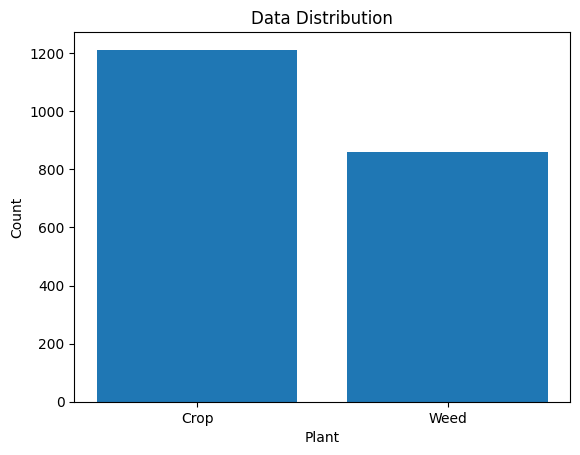

In [ ]:
categories = ['Crop', 'Weed']

# Create bar chart
plt.bar(categories, counter[:-1])
a
# Add labels and title
plt.xlabel('Plant')
plt.ylabel('Count')
plt.title('Data Distribution')

# Show plot
plt.show()


In [ ]:
import pandas as pd
df = pd.DataFrame(columns = Config.COLS)

for txt_file in annotations:
    temp = txt_file.split('.')[0]
    img_file = temp.replace('lables','images') + '.jpeg'
    # img_file = f"{}.jpeg"
    bboxes = list(map(lambda x: x.replace("\n", ""), open(f"{txt_file}").readlines()))
    for bbox in bboxes:
        label, x_center, y_center, W, H = bbox.split()
        label = int(label)
        x_center, y_center, W, H = list(map(lambda x: float(x), [x_center, y_center, W, H]))
        x1 = int(512*(x_center - W/2))
        x2 = int(512*(x_center + W/2))
        y1 = int(512*(y_center - H/2))
        y2 = int(512*(y_center + H/2))
        # image_id = img_file.split(".")[0]
        image_id = os.path.splitext(os.path.basename(img_file))[0]

        path = f"{img_file}"
        bbox = [x1, y1, x2, y2]
        label = classes_mapper[label]
        width = height = Config.IMG_SIZE

        # Appending row to the df
        row = [image_id, path, bbox, label, width, height]
        df.loc[len(df)] = row

df

,image_id,path,bbox,label,width,height
0,agri_0_1009,/content/drive/MyDrive/data/images/agri_0_1009...,"[172, 119, 449, 391]",weed,512,512
1,agri_0_1017,/content/drive/MyDrive/data/images/agri_0_1017...,"[8, 4, 500, 390]",weed,512,512
2,agri_0_1018,/content/drive/MyDrive/data/images/agri_0_1018...,"[20, 84, 434, 409]",weed,512,512
3,agri_0_1020,/content/drive/MyDrive/data/images/agri_0_1020...,"[66, 23, 440, 336]",weed,512,512
4,agri_0_1024,/content/drive/MyDrive/data/images/agri_0_1024...,"[161, 76, 453, 381]",weed,512,512
...,...,...,...,...,...,...
2067,agri_0_9963,/content/drive/MyDrive/data/images/agri_0_9963...,"[58, 80, 455, 336]",weed,512,512
2068,agri_0_9971,/content/drive/MyDrive/data/images/agri_0_9971...,"[45, 132, 228, 311]",weed,512,512
2069,agri_0_9971,/content/drive/MyDrive/data/images/agri_0_9971...,"[52, 355, 227, 512]",weed,512,512
2070,agri_0_9971,/content/drive/MyDrive/data/images/agri_0_9971...,"[272, 80, 458, 310]",weed,512,512


In [ ]:
df['path'][0]

'/content/drive/MyDrive/data/images/agri_0_1009.jpeg'

In [ ]:
import cv2


for idx, row in df.sample(10).iterrows():
    name = row["path"].split("/")[-1]
    image = cv2.imread(row["path"])
    x1, y1, x2, y2 = tuple(map(lambda a: int(a),row["bbox"]))
    print(f"[{idx}] x1, y1, x2, y2: ", x1, y1, x2, y2)
    print(f"Label: {row['label']}")
    image = cv2.rectangle(image,(x1,y1), (x2,y2), (0,255,0), 2)
    cv2.putText(image, f"({x1}, {y1})", (x1, y1), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (36,255,12), 2)
    cv2.putText(image, f"({x2}, {y2})", (x2, y2), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (36,255,12), 2)
    if image is not None:
      cv2.imwrite(f"./{name}", image)
    # display(Image(filename=f"./{name}"))

[2014] x1, y1, x2, y2:  38 169 480 438
Label: crop
[1907] x1, y1, x2, y2:  262 104 404 416
Label: weed
[1426] x1, y1, x2, y2:  77 151 427 366
Label: weed
[1579] x1, y1, x2, y2:  348 220 382 262
Label: crop
[1156] x1, y1, x2, y2:  219 114 431 399
Label: crop
[299] x1, y1, x2, y2:  246 342 311 383
Label: crop
[785] x1, y1, x2, y2:  286 384 314 429
Label: crop
[148] x1, y1, x2, y2:  8 27 512 353
Label: weed
[559] x1, y1, x2, y2:  50 98 164 265
Label: weed
[1798] x1, y1, x2, y2:  78 36 420 200
Label: weed


In [ ]:
# Split the dataset into train-valid-test splits
train_images, val_images, train_annotations, val_annotations = train_test_split(images, annotations, test_size = 0.2, random_state = 42)
val_images, test_images, val_annotations, test_annotations = train_test_split(images, annotations, test_size = 0.5, random_state = 42)

In [ ]:
# Split the dataset into train-valid-test splits
# train_images, val_images, train_annotations, val_annotations = train_test_split(images, annotations, test_size = 0.2, random_state = 42)
# val_images, test_images, val_annotations, test_annotations = train_test_split(images, annotations, test_size = 0.6, random_state = 42)
train_images=images[0:1200]
val_images=images[1000:1300]
 test_images=images[1100:1300]
  train_annotations=annotations[0:1200]
val_annotations=annotations[1000:1300]
test_annotations=annotations[1100:1300]

In [ ]:
!mkdir images/train images/val images/test labels/train labels/val labels/test

In [ ]:
def move_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.copy(f, destination_folder)
        except:
            print(f)
            assert False

# Move the splits into their folders
move_files_to_folder(train_images, '/content/images/train/')
move_files_to_folder(val_images, '/content/images/val/')
move_files_to_folder(test_images, '/content/images/test/')
move_files_to_folder(train_annotations, '/content/labels/train/')
move_files_to_folder(val_annotations, '/content/labels/val/')
move_files_to_folder(test_annotations, '/content/labels/test/')

In [ ]:
yaml_content = """
train: /content/images/train/
val:  /content/images/val/
test: /content/images/test/

# number of classes
nc: 2

# class names
names: [0,1]
"""

with open("/content/weed.yaml", "w") as file:
    file.write(yaml_content)

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.4/750.4 kB 9.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
from ultralytics import YOLO

In [ ]:
import yaml

with open('/content/weed.yaml', 'r') as file:
    try:
        yaml_content = yaml.safe_load(file)

        # Now you can check the content
        print(yaml_content)

    except yaml.YAMLError as exc:
        print(exc)

{'train': '/content/images/train/', 'val': '/content/images/val/', 'test': '/content/images/test/', 'nc': 2, 'names': [0, 1]}


In [ ]:
!ls

annotations  drive  images  labels  sample_data  weed.yaml


In [ ]:
import wandb

ModuleNotFoundError: No module named 'wandb'

In [ ]:
model = YOLO("yolov9c.pt")

100%|██████████| 49.7M/49.7M [00:00<00:00, 222MB/s]


In [ ]:
results = model.train(
   data='weed.yaml',
   imgsz=640,
   epochs=500,
   batch=8,
   name='yolov9c')

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=weed.yaml, epochs=150, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8m, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, lin

100%|██████████| 755k/755k [00:00<00:00, 20.3MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 117MB/s]


AMP: checks passed ✅


train: Scanning /content/labels/train... 1040 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1040/1040 [00:03<00:00, 339.26it/s]

train: New cache created: /content/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/labels/val... 520 images, 0 backgrounds, 0 corrupt: 100%|██████████| 520/520 [00:01<00:00, 315.42it/s]


val: New cache created: /content/labels/val.cache
Plotting labels to runs/detect/yolov8m/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8m
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      3.96G      1.759      2.526      2.059         27        640: 100%|██████████| 130/130 [00:40<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.32it/s]

                   all        520        820     0.0246       0.28    0.00981     0.0028



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      4.27G      1.741      2.142      2.026         21        640: 100%|██████████| 130/130 [00:39<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.57it/s]


                   all        520        820      0.101      0.347     0.0989     0.0281

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      4.27G      1.769      2.122      2.016         41        640: 100%|██████████| 130/130 [00:37<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.67it/s]

                   all        520        820      0.357      0.412      0.424       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150       4.2G      1.731      2.102      1.988         23        640: 100%|██████████| 130/130 [00:38<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.87it/s]

                   all        520        820      0.104      0.227      0.076     0.0213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      4.22G      1.663      1.956      1.935         22        640: 100%|██████████| 130/130 [00:37<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.63it/s]

                   all        520        820      0.248      0.392      0.298      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      4.28G      1.619      1.984      1.897         22        640: 100%|██████████| 130/130 [00:37<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.87it/s]

                   all        520        820      0.467      0.527      0.536      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      4.28G      1.571      1.813      1.878         24        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.83it/s]

                   all        520        820      0.698      0.478      0.489      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      4.22G      1.564      1.813      1.846         23        640: 100%|██████████| 130/130 [00:37<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.65it/s]

                   all        520        820      0.268      0.351      0.255      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      4.26G      1.584      1.726       1.85         21        640: 100%|██████████| 130/130 [00:37<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.75it/s]

                   all        520        820      0.507      0.425      0.435       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      4.27G       1.54      1.724      1.819         26        640: 100%|██████████| 130/130 [00:38<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.08it/s]


                   all        520        820      0.764      0.503      0.609      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      4.29G      1.491      1.625       1.78         27        640: 100%|██████████| 130/130 [00:38<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.57it/s]

                   all        520        820      0.816      0.529      0.684      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      4.27G      1.528      1.668      1.806         39        640: 100%|██████████| 130/130 [00:37<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.76it/s]

                   all        520        820      0.659      0.479      0.538      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      4.26G      1.458       1.57      1.729         34        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.08it/s]

                   all        520        820      0.553      0.607      0.585      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      4.24G      1.472      1.543      1.751         24        640: 100%|██████████| 130/130 [00:38<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.63it/s]

                   all        520        820      0.685      0.465      0.556       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      4.23G      1.447      1.594      1.739         31        640: 100%|██████████| 130/130 [00:37<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.60it/s]

                   all        520        820      0.804      0.583      0.727      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      4.22G      1.534      1.623      1.807         27        640: 100%|██████████| 130/130 [00:38<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.07it/s]


                   all        520        820      0.637      0.618      0.687      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      4.23G      1.432      1.506      1.718         32        640: 100%|██████████| 130/130 [00:38<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.56it/s]

                   all        520        820      0.766      0.679      0.759       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      4.23G      1.441      1.511      1.723         19        640: 100%|██████████| 130/130 [00:38<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.83it/s]

                   all        520        820      0.797      0.513      0.668      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      4.28G      1.412      1.477      1.721         17        640: 100%|██████████| 130/130 [00:38<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.93it/s]


                   all        520        820      0.719      0.627      0.699      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      4.22G      1.419       1.47      1.699         22        640: 100%|██████████| 130/130 [00:37<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.55it/s]

                   all        520        820        0.5      0.359        0.4      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      4.29G      1.444      1.461      1.723         28        640: 100%|██████████| 130/130 [00:37<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.88it/s]

                   all        520        820      0.606      0.638       0.67      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      4.28G       1.42       1.45      1.707         23        640: 100%|██████████| 130/130 [00:38<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.95it/s]

                   all        520        820      0.809      0.642      0.737      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      4.27G      1.381      1.357      1.671         23        640: 100%|██████████| 130/130 [00:38<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.58it/s]

                   all        520        820      0.607      0.477      0.512      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      4.24G      1.414      1.385      1.711         28        640: 100%|██████████| 130/130 [00:37<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.74it/s]

                   all        520        820      0.727      0.682      0.737      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      4.28G      1.381      1.383      1.682         22        640: 100%|██████████| 130/130 [00:38<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.08it/s]

                   all        520        820      0.739      0.664      0.767      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      4.28G      1.367      1.348       1.67         26        640: 100%|██████████| 130/130 [00:37<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.62it/s]

                   all        520        820      0.773      0.769      0.824       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      4.28G       1.38      1.348       1.68         38        640: 100%|██████████| 130/130 [00:37<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.76it/s]

                   all        520        820      0.783      0.661      0.773      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      4.21G      1.382      1.364      1.679         34        640: 100%|██████████| 130/130 [00:38<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.91it/s]


                   all        520        820      0.723      0.685      0.747      0.445

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      4.22G      1.341      1.292      1.634         45        640: 100%|██████████| 130/130 [00:37<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.52it/s]

                   all        520        820      0.794      0.722      0.812      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150       4.2G      1.355      1.333      1.649         35        640: 100%|██████████| 130/130 [00:38<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.90it/s]

                   all        520        820      0.447      0.395      0.426      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      4.22G      1.373       1.32      1.668         24        640: 100%|██████████| 130/130 [00:38<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.95it/s]


                   all        520        820      0.683      0.705      0.736      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      4.27G      1.355      1.329      1.666         24        640: 100%|██████████| 130/130 [00:37<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.60it/s]

                   all        520        820      0.705      0.681      0.725      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      4.23G      1.339      1.326      1.661         22        640: 100%|██████████| 130/130 [00:37<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.79it/s]

                   all        520        820       0.74      0.711      0.797      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      4.19G      1.286      1.268      1.618         21        640: 100%|██████████| 130/130 [00:38<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.05it/s]

                   all        520        820       0.72       0.65      0.732      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      4.23G      1.324       1.24      1.616         19        640: 100%|██████████| 130/130 [00:38<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.62it/s]

                   all        520        820      0.757      0.632      0.725      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      4.21G       1.32      1.258      1.617         19        640: 100%|██████████| 130/130 [00:37<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.75it/s]

                   all        520        820      0.805      0.699      0.825      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      4.23G      1.344      1.284      1.629         21        640: 100%|██████████| 130/130 [00:38<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.06it/s]

                   all        520        820      0.575      0.437      0.441      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      4.21G      1.282      1.248      1.626         24        640: 100%|██████████| 130/130 [00:38<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.61it/s]

                   all        520        820      0.841      0.692       0.82      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      4.22G      1.287      1.179      1.607         16        640: 100%|██████████| 130/130 [00:37<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.81it/s]

                   all        520        820      0.656      0.644      0.701      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      4.21G      1.298       1.18      1.622         22        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.99it/s]

                   all        520        820       0.72      0.729      0.797        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      4.24G      1.268      1.166      1.613         23        640: 100%|██████████| 130/130 [00:37<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.61it/s]

                   all        520        820      0.773      0.734      0.812      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      4.22G      1.308      1.209      1.612         39        640: 100%|██████████| 130/130 [00:38<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.89it/s]

                   all        520        820       0.72      0.706      0.743      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      4.22G      1.293      1.231      1.613         28        640: 100%|██████████| 130/130 [00:38<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.94it/s]


                   all        520        820      0.806       0.75      0.837      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      4.22G      1.236       1.16      1.589         19        640: 100%|██████████| 130/130 [00:37<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.55it/s]

                   all        520        820      0.823      0.779      0.853      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      4.23G      1.266      1.167      1.584         28        640: 100%|██████████| 130/130 [00:37<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.94it/s]

                   all        520        820      0.445      0.511      0.476      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      4.21G      1.292      1.197        1.6         27        640: 100%|██████████| 130/130 [00:38<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.89it/s]

                   all        520        820      0.807       0.76      0.836      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      4.21G      1.287      1.164      1.589         26        640: 100%|██████████| 130/130 [00:37<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.58it/s]

                   all        520        820      0.734      0.702       0.77      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      4.23G      1.299      1.262      1.607         43        640: 100%|██████████| 130/130 [00:38<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.97it/s]

                   all        520        820      0.758      0.746      0.812      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      4.22G      1.264      1.149       1.56         32        640: 100%|██████████| 130/130 [00:38<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.80it/s]

                   all        520        820      0.803      0.761      0.836       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      4.21G      1.258      1.149      1.574         36        640: 100%|██████████| 130/130 [00:37<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.57it/s]

                   all        520        820      0.815      0.709      0.812      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      4.22G      1.256      1.107       1.56         19        640: 100%|██████████| 130/130 [00:38<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.95it/s]

                   all        520        820      0.806      0.762      0.832      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      4.22G      1.253      1.113      1.573         43        640: 100%|██████████| 130/130 [00:38<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.78it/s]

                   all        520        820      0.825      0.785      0.858      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      4.28G      1.246       1.13      1.559         22        640: 100%|██████████| 130/130 [00:37<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.58it/s]

                   all        520        820      0.809      0.766      0.859      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      4.22G      1.238      1.095      1.567         26        640: 100%|██████████| 130/130 [00:38<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.08it/s]

                   all        520        820      0.836      0.777      0.862      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      4.23G      1.232      1.106      1.562         29        640: 100%|██████████| 130/130 [00:38<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.54it/s]

                   all        520        820      0.808      0.778      0.843      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      4.23G      1.228      1.096      1.576         25        640: 100%|██████████| 130/130 [00:37<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.65it/s]

                   all        520        820      0.846      0.746      0.852      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      4.22G      1.248      1.089      1.578         30        640: 100%|██████████| 130/130 [00:38<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.09it/s]

                   all        520        820      0.813      0.785      0.848      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      4.23G      1.252      1.107      1.566         21        640: 100%|██████████| 130/130 [00:38<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.54it/s]

                   all        520        820      0.644       0.62       0.67      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      4.21G      1.257      1.126      1.564         30        640: 100%|██████████| 130/130 [00:37<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.57it/s]

                   all        520        820      0.798      0.784      0.855      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      4.22G      1.216      1.076      1.547         27        640: 100%|██████████| 130/130 [00:38<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.07it/s]

                   all        520        820      0.843      0.789      0.861      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      4.22G       1.17      1.023      1.516         28        640: 100%|██████████| 130/130 [00:38<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.56it/s]

                   all        520        820      0.841       0.75      0.853      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      4.22G      1.226      1.072      1.541         27        640: 100%|██████████| 130/130 [00:37<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.56it/s]

                   all        520        820      0.758      0.732       0.81      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      4.21G      1.217      1.064       1.56         20        640: 100%|██████████| 130/130 [00:38<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.09it/s]

                   all        520        820      0.618      0.549      0.579      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      4.22G       1.23      1.086      1.564         20        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.61it/s]

                   all        520        820      0.808      0.768      0.856      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      4.22G      1.211      1.043      1.545         23        640: 100%|██████████| 130/130 [00:37<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.56it/s]

                   all        520        820      0.823      0.802      0.872      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      4.13G      1.206      1.038       1.55         23        640: 100%|██████████| 130/130 [00:38<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.11it/s]

                   all        520        820      0.783      0.785      0.842      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      4.22G      1.234      1.069      1.554         46        640: 100%|██████████| 130/130 [00:38<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.59it/s]

                   all        520        820      0.824      0.765      0.847      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      4.27G      1.188       1.05      1.544         20        640: 100%|██████████| 130/130 [00:37<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.57it/s]

                   all        520        820      0.858      0.766      0.869      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      4.22G      1.208       1.05      1.545         32        640: 100%|██████████| 130/130 [00:38<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.08it/s]

                   all        520        820      0.775      0.755      0.791      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      4.27G        1.2      1.035      1.545         29        640: 100%|██████████| 130/130 [00:38<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.58it/s]

                   all        520        820      0.828      0.817      0.877      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      4.22G      1.218      1.063      1.553         38        640: 100%|██████████| 130/130 [00:37<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.60it/s]

                   all        520        820      0.749      0.653      0.754      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      4.22G      1.207      1.042      1.535         18        640: 100%|██████████| 130/130 [00:38<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.09it/s]

                   all        520        820      0.744      0.676      0.743      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      4.21G      1.208      1.019       1.53         31        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.59it/s]

                   all        520        820      0.862      0.814      0.892      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      4.22G      1.189      1.017      1.533         25        640: 100%|██████████| 130/130 [00:37<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.60it/s]

                   all        520        820      0.831      0.765      0.871      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      4.21G      1.174      1.029      1.516         26        640: 100%|██████████| 130/130 [00:38<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.07it/s]

                   all        520        820       0.83      0.785      0.867      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      4.22G      1.173          1      1.527         36        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.60it/s]


                   all        520        820      0.845      0.804       0.88      0.567

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      4.29G      1.189      0.996      1.511         20        640: 100%|██████████| 130/130 [00:37<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.55it/s]

                   all        520        820      0.864      0.803      0.893      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      4.29G      1.168      1.007      1.531         26        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.08it/s]

                   all        520        820      0.817      0.773       0.85      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      4.22G      1.177      1.001      1.508         19        640: 100%|██████████| 130/130 [00:38<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.61it/s]


                   all        520        820       0.79      0.729      0.834      0.546

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      4.22G      1.175     0.9849      1.512         28        640: 100%|██████████| 130/130 [00:37<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.61it/s]

                   all        520        820      0.873       0.82      0.897      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      4.23G      1.124     0.9508      1.482         20        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.02it/s]

                   all        520        820      0.854       0.82      0.892      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      4.22G      1.191     0.9801      1.514         30        640: 100%|██████████| 130/130 [00:38<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.67it/s]

                   all        520        820      0.861      0.804      0.896      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      4.21G      1.168     0.9694      1.492         19        640: 100%|██████████| 130/130 [00:37<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.61it/s]

                   all        520        820      0.851      0.807      0.896      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      4.22G      1.154     0.9748      1.501         27        640: 100%|██████████| 130/130 [00:38<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.11it/s]

                   all        520        820      0.783      0.773      0.837      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      4.21G      1.106     0.9584      1.474         22        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.63it/s]

                   all        520        820      0.806       0.84      0.885      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150       4.2G      1.148     0.9763      1.494         20        640: 100%|██████████| 130/130 [00:37<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.60it/s]

                   all        520        820      0.843      0.846      0.908      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      4.28G      1.143     0.9771       1.48         23        640: 100%|██████████| 130/130 [00:38<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.08it/s]

                   all        520        820      0.849      0.813      0.892      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      4.22G      1.152       0.99      1.489         17        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.82it/s]

                   all        520        820      0.847      0.812      0.894      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      4.21G       1.15     0.9559       1.48         18        640: 100%|██████████| 130/130 [00:37<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.59it/s]

                   all        520        820       0.86      0.766      0.885      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      4.21G      1.115     0.9097      1.461         29        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.08it/s]

                   all        520        820      0.853      0.828      0.911      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      4.29G      1.145     0.9501      1.486         35        640: 100%|██████████| 130/130 [00:38<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.74it/s]

                   all        520        820      0.802      0.801      0.856      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150      4.21G      1.141     0.9216      1.487         24        640: 100%|██████████| 130/130 [00:37<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.60it/s]

                   all        520        820      0.835      0.853      0.908      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      4.21G      1.113     0.9035       1.46         58        640: 100%|██████████| 130/130 [00:38<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.08it/s]

                   all        520        820      0.842      0.849      0.908      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      4.21G      1.118     0.9073      1.466         19        640: 100%|██████████| 130/130 [00:38<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  3.69it/s]


                   all        520        820      0.845      0.847      0.917      0.635

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      4.23G      1.133     0.9156      1.473         23        640: 100%|██████████| 130/130 [00:37<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.63it/s]

                   all        520        820      0.842      0.866      0.922      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      4.21G      1.149     0.9431      1.478         18        640: 100%|██████████| 130/130 [00:38<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.10it/s]

                   all        520        820      0.836      0.853      0.903      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150       4.2G      1.144     0.9441      1.475         42        640: 100%|██████████| 130/130 [00:39<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.62it/s]

                   all        520        820      0.867      0.836      0.912      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      4.29G      1.122     0.9175      1.456         20        640: 100%|██████████| 130/130 [00:37<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.59it/s]

                   all        520        820      0.887       0.83      0.922      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150       4.2G      1.108     0.9308      1.465         30        640: 100%|██████████| 130/130 [00:38<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:08<00:00,  4.07it/s]

                   all        520        820      0.858      0.842      0.914      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      4.24G      1.111     0.9009      1.474         33        640: 100%|██████████| 130/130 [00:38<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.62it/s]

                   all        520        820      0.865      0.853      0.919      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      4.28G      1.119     0.9003      1.456         39        640: 100%|██████████| 130/130 [00:37<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:09<00:00,  3.63it/s]

                   all        520        820      0.863      0.844      0.919      0.645


In [ ]:
metrics = model.val(data='/content/weed.yaml', split = 'test')

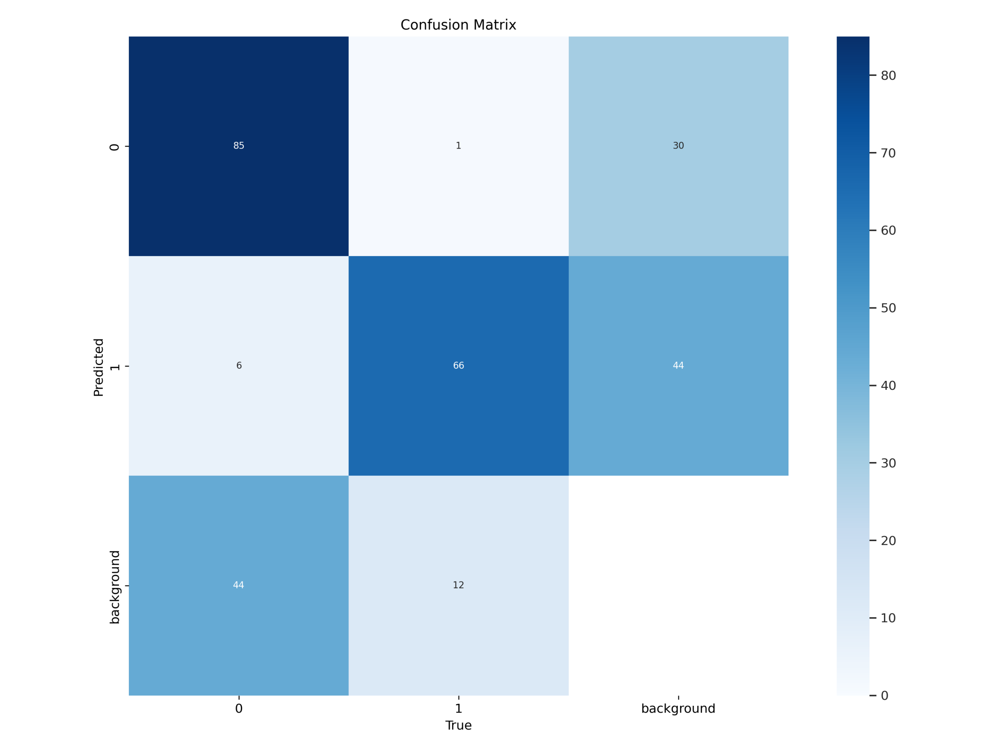

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def show_results(file):
    plt.figure(figsize=(30,30))
    img = np.asarray(Image.open(file))
    plt.imshow(img)
    plt.axis('off')

# Call the function with the image file path
show_results("/content/runs/detect/yolov8m2/confusion_matrix.png")

# Display the image


In [ ]:
# def show_results(file):
#     plt.figure(figsize=(30,30))
#     img = np.asarray(Image.open(file))
#     plt.imshow(img)
#     plt.axis('off')

def show_results(file):
    try:
        plt.figure(figsize=(30,30))
        img = np.asarray(Image.open(file))
        plt.imshow(img)
        plt.axis('off')
        plt.show()
    except Exception as e:
        print("Error:", e)


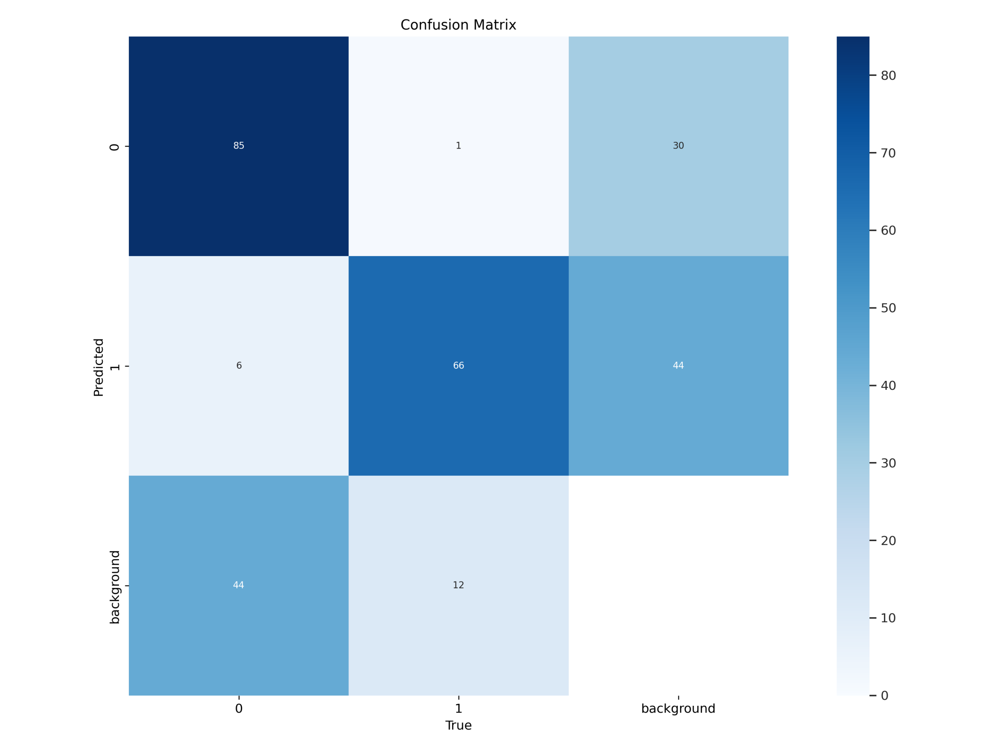

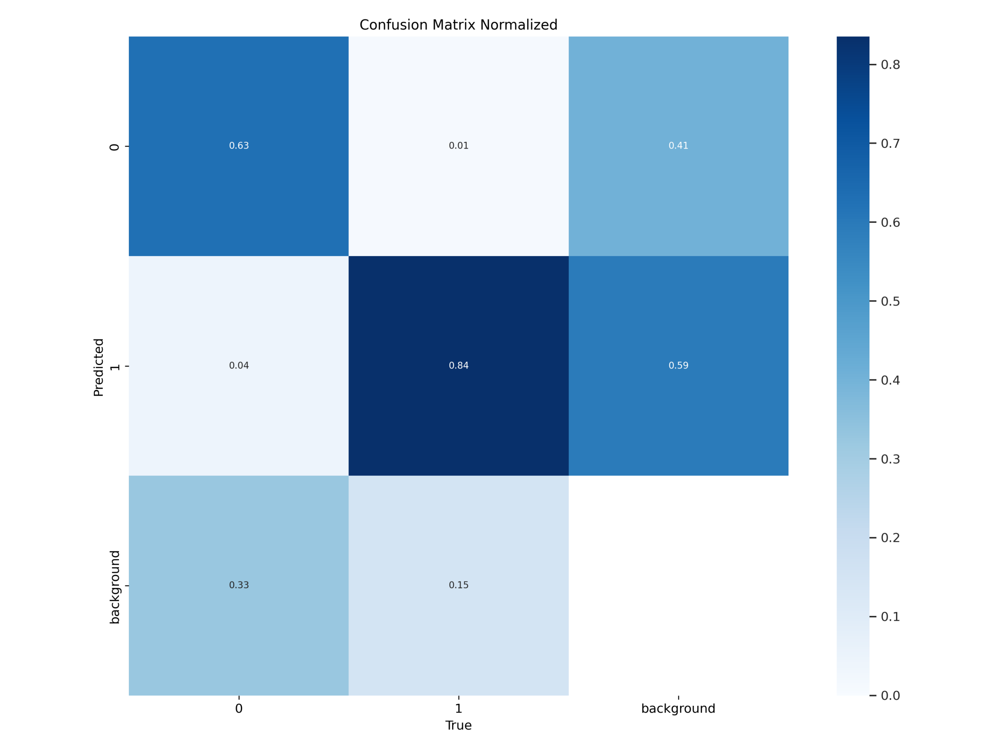

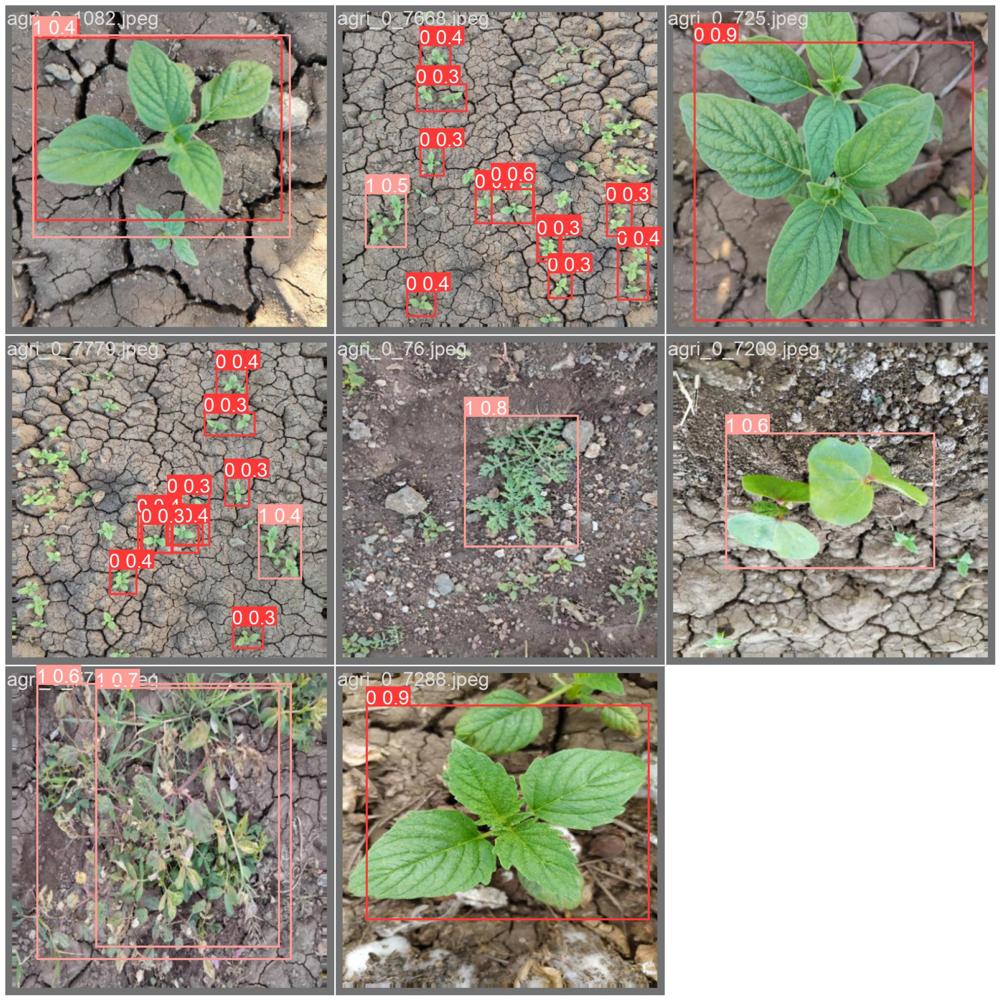

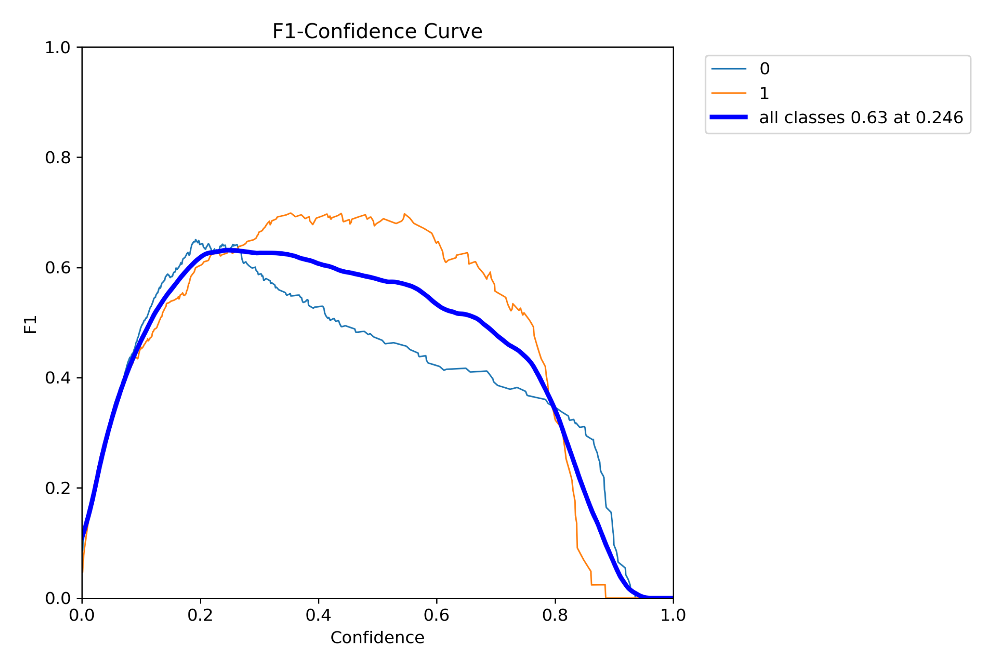

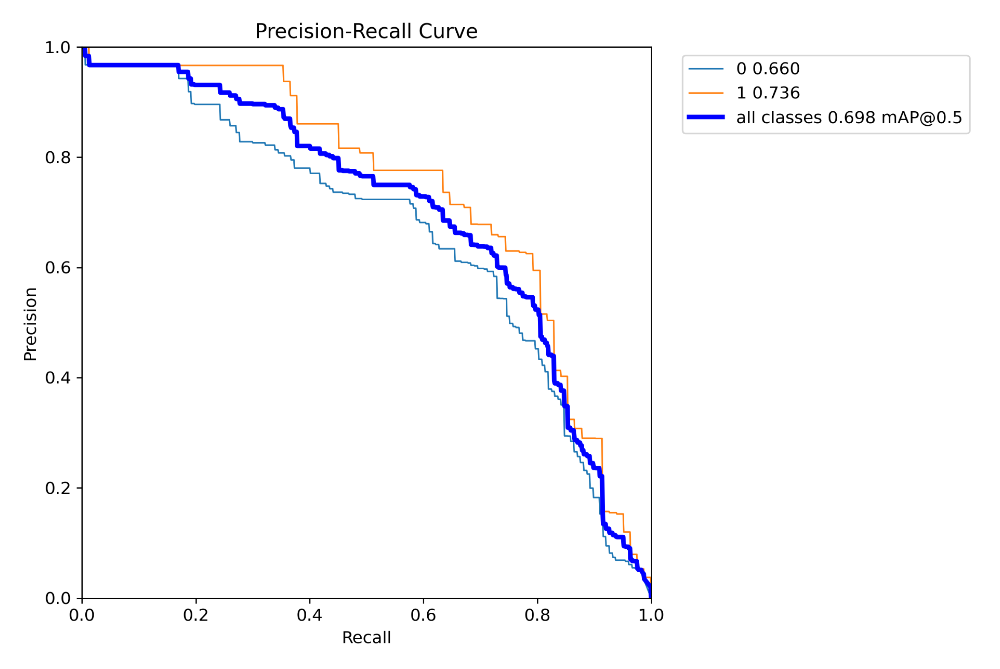

In [ ]:
show_results('/content/runs/detect/yolov8m2/confusion_matrix.png')
show_results('/content/runs/detect/yolov8m2/confusion_matrix_normalized.png')
show_results('/content/runs/detect/yolov8m2/val_batch0_pred.jpg')
show_results('/content/runs/detect/yolov8m/F1_curve.png')
show_results('/content/runs/detect/yolov8m/PR_curve.png')
plt.show()